In [213]:
import numpy as np
import numpy.linalg as npl
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
from IPython.display import Audio
from numpy.fft import fft,ifft

In [214]:
Fs,data = read('StarWars60.wav')
print('Length of data:',len(data))
print('Sampling frequency',Fs)
print('Number of seconds: ',len(data)/Fs)

sigma=1000
np.random.seed(0)
noise=sigma*np.random.randn(len(data))
noisy_data = data+noise
print('Signal to noise ratio:', npl.norm(noise)**2/npl.norm(data)**2)

Length of data: 1323000
Sampling frequency 22050
Number of seconds:  60.0
Signal to noise ratio: 0.04565424046034273


In [215]:
Audio(noisy_data,rate=Fs)

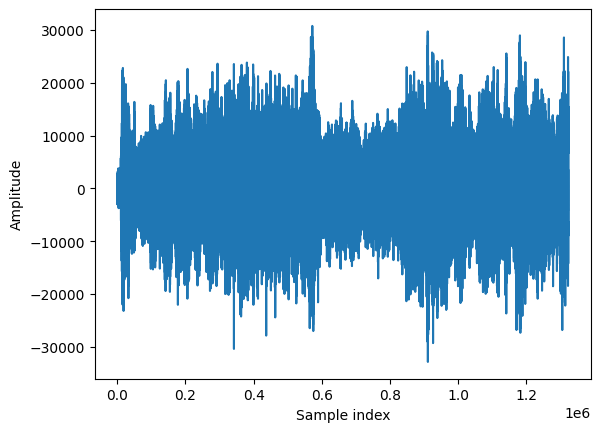

In [216]:
plt.figure()
plt.plot(noisy_data)
plt.xlabel('Sample index')
plt.ylabel('Amplitude')
plt.show()

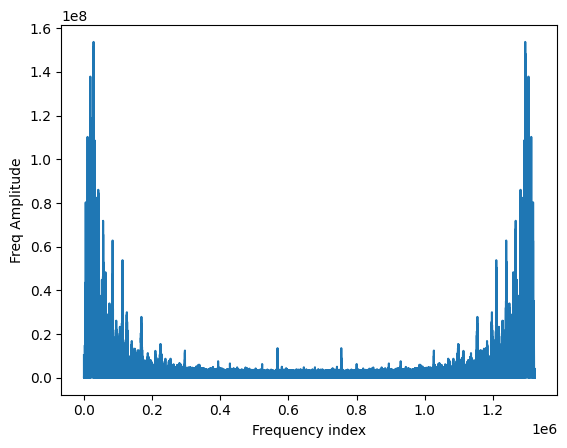

In [217]:
freq_data=fft(data)
freq_noise=fft(noise)
freq_ndata=fft(noisy_data)

plt.figure()
plt.plot(np.abs(freq_ndata))
plt.xlabel('Frequency index')
plt.ylabel('Freq Amplitude')
plt.show()

In [218]:
# Low-pass filter
cutoff=0.23
cutoff_ix=int(cutoff*len(data))
LPF=np.ones(len(data))
LPF[cutoff_ix+1:-cutoff_ix]=0

freq_ndata_LPF = LPF*freq_ndata
denoised_data = ifft(freq_ndata_LPF)

print('Signal to noise ratio:', npl.norm(freq_noise*LPF)**2/npl.norm(freq_data)**2)
print('High-frequency ratio: ', npl.norm(freq_data*(1-LPF))**2/npl.norm(freq_data)**2)

# Total reconstruction error
print('Noise+High-freq error:', npl.norm(freq_ndata*LPF-freq_data)**2/npl.norm(freq_data)**2)

Signal to noise ratio: 0.021044764321740364
High-frequency ratio:  0.009581672382714972
Noise+High-freq error: 0.03062643670445539


In [219]:
Audio(denoised_data,rate=Fs)

In [220]:
Audio(noisy_data,rate=Fs)

## Designing an optimized filter

In [221]:
def get_BPF(st,en):
    # Low-pass
    ix=int(en*len(data))
    BPF=np.ones(len(data))
    BPF[ix+1:-ix]=0

    # High-pass
    if st>0:
        ix2=max(int(st*len(data)),1)
        BPF[0:ix2+1]=0
        BPF[-ix2:]=0
    return BPF

In [222]:
# Designing a filter
f1=0.1
f2=0.2
f3=0.3
BPF1=get_BPF(0.0,f1)
BPF2=get_BPF(f1,f2)*0.85
BPF3=get_BPF(f2,f3)*0.5

Filter=BPF1+BPF2+BPF3

freq_denoised = Filter*freq_ndata
denoised_data = ifft(freq_denoised)

print('Noise to signal ratio:', npl.norm(Filter*freq_noise)**2/npl.norm(freq_data)**2)
print('High-frequency ratio: ', npl.norm((1-Filter)*freq_data)**2/npl.norm(freq_data)**2)

# Total estimation error
print('Noise+High-freq error:', npl.norm(freq_ndata*Filter-freq_data)**2/npl.norm(freq_data)**2)

Noise to signal ratio: 0.018042618594997582
High-frequency ratio:  0.00861010764311775
Noise+High-freq error: 0.026663844466590626


Text(0, 0.5, 'filter response')

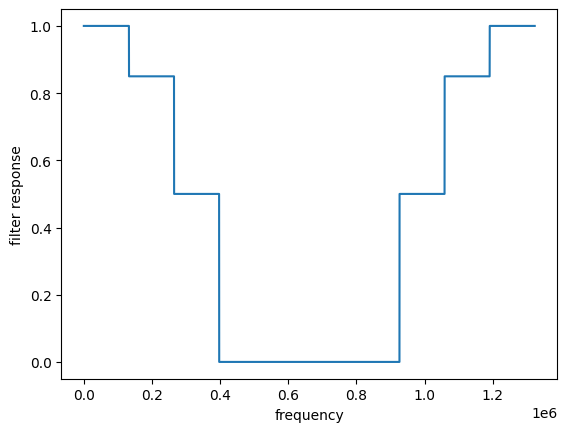

In [223]:
plt.plot(Filter)
plt.xlabel('frequency')
plt.ylabel('filter response')

In [224]:
Audio(denoised_data,rate=Fs)

In [225]:
# Designing a filter
fs=[0,0.1,0.2,0.3]
COEFS=[1,0.85,0.5]
Filter=np.zeros(N)
for i in range(3):
    Filter+=COEFS[i]*get_BPF(fs[i],fs[i+1])

freq_denoised = Filter*freq_ndata
denoised_data = ifft(freq_denoised)

print('Signal to noise ratio:', npl.norm(freq_noise*Filter)**2/npl.norm(freq_data*Filter)**2)
print('High-frequency ratio: ', npl.norm(freq_data*(1-Filter))**2/npl.norm(freq_data)**2)

# Total reconstruction error
print('Noise+High-freq error:', npl.norm(freq_ndata*Filter-freq_data)**2/npl.norm(freq_data)**2)

Signal to noise ratio: 0.018600020880197365
High-frequency ratio:  0.00861010764311775
Noise+High-freq error: 0.026663844466590626
